In [9]:
import pandas as pd
import numpy as np
import difflib
import geojson
from pymongo import MongoClient

client = MongoClient()
db = client.studio
collection_airbnb_madrid = db.airbnb_madrid
data_airbnb_madrid = pd.DataFrame(list(collection_airbnb_madrid.find()))

collection_buy_madrid = db.buy_madrid
data_buy_madrid = pd.DataFrame(list(collection_buy_madrid.find()))

collection_rent_madrid = db.rent_madrid
data_rent_madrid = pd.DataFrame(list(collection_rent_madrid.find()))

data_buy_madrid.dropna(inplace=True)
data_rent_madrid.dropna(inplace=True)

In [10]:
buy_madrid_prefilter = data_buy_madrid["_id"].count()
# We start by deleting extreme irrational cases
data_buy_madrid = data_buy_madrid[(data_buy_madrid.surface < 1500) & (data_buy_madrid.surface > 10) & (data_buy_madrid.price > 10000)  & (data_buy_madrid.toilets < 10)]
# Done that, we filter for other possible outliers
data_buy_madrid = data_buy_madrid[np.abs(data_buy_madrid.price-data_buy_madrid.price.mean())<=(3*data_buy_madrid.price.std())]
print("Filtered values for: properties for sale Madrid")
print(buy_madrid_prefilter - data_buy_madrid["_id"].count())

print(buy_barcelona_prefilter - data_buy_barcelona["_id"].count())


rent_madrid_prefilter = data_rent_madrid["_id"].count()
data_rent_madrid = data_rent_madrid[(data_rent_madrid.surface < 1500) & (data_rent_madrid.surface > 10) & (data_rent_madrid.price > 100) & (data_rent_madrid.toilets < 10)]
data_rent_madrid = data_rent_madrid[np.abs(data_rent_madrid.price-data_rent_madrid.price.mean())<=(3*data_rent_madrid.price.std())]
print("Filtered values for: properties for rent Madrid")
print(rent_madrid_prefilter - data_rent_madrid["_id"].count())

rent_barcelona_prefilter = data_rent_barcelona["_id"].count()

Filtered values for: properties for sale Madrid
976
9993
Filtered values for: properties for rent Madrid
164


In [11]:
# We filter the price column to get it from string to float
data_airbnb_madrid["price"] = data_airbnb_madrid['price'].str.replace('$','').str.replace(',','')
data_airbnb_madrid["price"] = data_airbnb_madrid["price"].astype(float)

In [12]:
# Scrapped data includes "Zona" as it is added by habitaclia. We remove that string for a better standarization
# with airbnb "neighbourhood" column. 
# At the end we want to have a column to join habitaclia data with the airbnb dataset

def make_geojson_coords(x):
    coords_obj = {"type": "Point", "coordinates": [x['longitude'],x['latitude']]}
    return coords_obj

def get_neighbourhood_airbnb(x,s):
    if x["area"]:
        area = x["area"]
        detected_area = difflib.get_close_matches(area, s)
        if detected_area:
            return detected_area[0]
        else:
            return None
    else:
        return None

def unfold_coords(x, coord):
    try:
        if x["coords"]:
            if coord == "lat":
                lat = x["coords"]["coordinates"][1]
                return lat
            if coord == "lon":
                lon = x["coords"]["coordinates"][0]
                return lon
        else:
            return None
    except:
        return None


data_buy_madrid["area"] = data_buy_madrid['area'].str.replace('Zona ','')
# Images and features are lists. We'll generate a couple of columns so we can work with their lenght
data_buy_madrid["images_len"] = data_buy_madrid['images'].str.len()
data_buy_madrid["features_len"] = data_buy_madrid['feats'].str.len()

data_rent_madrid["area"] = data_rent_madrid['area'].str.replace('Zona ','')
data_rent_madrid["images_len"] = data_rent_madrid['images'].str.len()
data_rent_madrid["features_len"] = data_rent_madrid['feats'].str.len()


# neighbourhood_barcelona / madrid were downloaded form the insideairbnb site


with open("neighbourhood_madrid.geojson") as geo_madrid:
    gj_madrid = geojson.load(geo_madrid)
features_madrid = gj_madrid['features']

# we'll extract all the unique neighbourhoods from those datasets
set_madrid = set( val for dic in features_madrid for val in dic["properties"].values())

# and then relate them to the filtered "area" column in our datasets from habitaclia
data_buy_madrid["neighbourhood"] = data_buy_madrid.apply((lambda x: get_neighbourhood_airbnb(x,set_madrid)), axis=1)
data_rent_madrid["neighbourhood"] = data_buy_madrid.apply((lambda x: get_neighbourhood_airbnb(x, set_madrid)), axis=1)


# Mapbox maps in plotly are very picky
# they need lat and lon columns not geojson. But we'll need both, lat/lon for plot and geojson
# for the custom choropleths and other geo operations.
# We unfold the geojson point into lat/lon for easy processing with plotly mapbox maps
data_buy_madrid['lat'] = data_buy_madrid.apply((lambda x: unfold_coords(x,'lat')), axis=1)
data_buy_madrid['lon'] = data_buy_madrid.apply((lambda x: unfold_coords(x,'lon')), axis=1)

data_rent_madrid['lat'] = data_rent_madrid.apply((lambda x: unfold_coords(x,'lat')), axis=1)
data_rent_madrid['lon'] = data_rent_madrid.apply((lambda x: unfold_coords(x,'lon')), axis=1)

# for the same reason we'll also need the coords in the airbnb dataset to be in geojson as well
data_airbnb_madrid["coords"] = data_airbnb_madrid.apply(make_geojson_coords, axis=1)

In [13]:
unique_feats = (data_buy_madrid["feats"].explode().unique())



In [14]:
# As we have a lot of rendudant/unclean feats, we select the ones we are interested in and we code them into
# the dataset by using a custom one-hot encoding
# feats:  'Aire acondicionado ', 'Amueblado ', 'Ascensor ', 'Chimenea ', 'Cerca de transporte público ', 
# 'Equipamiento deportivo ', 'Obra nueva ', 'Jardín comunitario ', 'Piscina comunitaria ', 'Piscina propia '
# 'Trastero ', 'Vistas a la ciudad ', 'Vistas a la montaña ', 'Vigilancia ', 'Plaza parking '
def encode_key_feats(x,feat):
    if feat == "air_conditioning":
        if 'Aire acondicionado ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "furniture":
        if 'Amueblado ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "elevator":
        if 'Ascensor ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "chimney":
        if 'Chimenea ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "public_transport":
        if 'Cerca de transporte público ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "sports":
        if 'Equipamiento deportivo ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "new_construction":
        if 'Obra nueva ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "garden_community":
        if 'Jardín comunitario ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "pool_community":
        if 'Piscina comunitaria ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "pool":
        if 'Piscina propia ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "storage":
        if 'Trastero ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "views_city":
        if 'Vistas a la ciudad ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "views_mountain":
        if 'Vistas a la montaña ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "security":
        if 'Vigilancia ' in x["feats"]:
            return 1
        else:
            return 0
    if feat == "parking":
        if 'Plaza parking ' in x["feats"]:
            return 1
        else:
            return 0
        
def encode_features(dataset):
    features = ["parking", "security", "views_mountain", "views_city", "storage", "pool", "pool_community",
               "garden_community", "new_construction", "sports", "public_transport", "chimney", "chimney",
               "elevator", "air_conditioning"]

    for f in features:
        dataset[f] = dataset.apply((lambda x: encode_key_feats(x,f)), axis=1)
    
    return dataset

        

data_buy_madrid = encode_features(data_buy_madrid)
data_rent_madrid = encode_features(data_rent_madrid)

In [42]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go




fig = make_subplots(rows=2,cols=2, subplot_titles=('Price','Surface'))
fig.add_box(y=data_rent_madrid["price"], name="Rent price", row=1, col=1)
fig.add_box(y=data_rent_madrid["surface"], name="Rent surface", row=1, col=2)
fig.add_box(y=data_buy_madrid["price"], name="Sale price", row=2, col=1)
fig.add_box(y=data_buy_madrid["surface"], name="Sale surface", row=2, col=2) 

fig.update_layout(height=800, width=800, title_text="Properties for rent and sale in Madrid")

fig.show()






In [47]:
data_rent_madrid.describe()


,toilets,price,rooms,surface,images_len,features_len,lat,lon,parking,security,...,storage,pool,pool_community,garden_community,new_construction,sports,public_transport,chimney,elevator,air_conditioning
count,5315.000000,5315.000000,5315.000000,5315.000000,5315.000000,5315.000000,5315.000000,5315.000000,5315.000000,5315.000000,...,5315.000000,5315.000000,5315.000000,5315.000000,5315.0,5315.000000,5315.000000,5315.000000,5315.000000,5315.000000
mean,1.612794,1359.907808,2.228598,97.840640,21.757291,9.875823,39.047290,-6.459051,0.205268,0.013735,...,0.185889,0.016745,0.156350,0.025964,0.0,0.056820,0.051552,0.003763,0.696707,0.617686
std,0.978421,1028.715834,1.119443,76.373047,11.802643,2.557728,7.423463,14.158736,0.403935,0.116399,...,0.389054,0.128327,0.363221,0.159044,0.0,0.231521,0.221142,0.061233,0.459724,0.485998
min,1.000000,250.000000,1.000000,12.000000,0.000000,3.000000,-39.836990,-109.963456,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,790.000000,1.000000,56.000000,14.000000,8.000000,40.406138,-3.715618,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1000.000000,2.000000,78.000000,20.000000,10.000000,40.424364,-3.701404,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,1.000000
75%,2.000000,1550.000000,3.000000,111.000000,27.000000,11.000000,40.444376,-3.669435,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,1.000000
max,9.000000,14000.000000,10.000000,1000.000000,108.000000,24.000000,50.878285,23.352933,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000


In [105]:
# GENERAL STATISTICS FOR RENT MADRID: PRICE
print("Properties for rent in Madrid")

price_analysis_tags = ["mean", "sd", "kurtosis", "mode", "min", "max", "sum"]
price_analysis = [data_rent_madrid["price"].mean(),
                   data_rent_madrid["price"].std(),
                   data_rent_madrid["price"].kurtosis(),
                   data_rent_madrid["price"].mode()[0],
                   data_rent_madrid["price"].min(),
                   data_rent_madrid["price"].max(),
                   data_rent_madrid["price"].sum()]
surface_analysis = [data_rent_madrid["surface"].mean(),
                   data_rent_madrid["surface"].std(),
                   data_rent_madrid["surface"].kurtosis(),
                   data_rent_madrid["surface"].mode()[0],
                   data_rent_madrid["surface"].min(),
                   data_rent_madrid["surface"].max(),
                   data_rent_madrid["surface"].sum()]
data = {'Metric': price_analysis_tags, 'Price': price_analysis, 'Surface': surface_analysis}

df = pd.DataFrame (data, columns = ['Metric', 'Price', 'Surface'] )

df.round(3)

Properties for rent in Madrid


,Metric,Price,Surface
0,mean,1359.908,97.841
1,sd,1028.716,76.373
2,kurtosis,25.329,26.942
3,mode,850.000,70.000
4,min,250.000,12.000
5,max,14000.000,1000.000
6,sum,7227910.000,520023.000


In [48]:
data_buy_madrid.describe()

,toilets,price,rooms,surface,images_len,features_len,lat,lon,parking,security,...,storage,pool,pool_community,garden_community,new_construction,sports,public_transport,chimney,elevator,air_conditioning
count,14215.000000,1.421500e+04,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,...,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000,14215.000000
mean,1.944777,3.853082e+05,3.018361,140.734998,23.690116,9.269363,38.356377,-7.467965,0.301794,0.011326,...,0.310798,0.073233,0.154344,0.044249,0.000281,0.066409,0.046289,0.006120,0.494267,0.440943
std,1.251807,3.845598e+05,1.322815,127.570034,14.641915,2.999714,9.881215,16.918537,0.459052,0.105823,...,0.462837,0.260527,0.361291,0.205655,0.016773,0.249004,0.210118,0.077995,0.499985,0.496517
min,1.000000,1.450000e+04,1.000000,14.000000,0.000000,3.000000,-40.567315,-109.963456,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.429850e+05,2.000000,70.000000,13.000000,7.000000,40.360301,-3.795549,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,2.350000e+05,3.000000,96.000000,21.000000,9.000000,40.420418,-3.702928,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.000000,4.745250e+05,4.000000,157.000000,31.000000,11.000000,40.457581,-3.648678,1.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,9.000000,2.210000e+06,14.000000,1480.000000,220.000000,25.000000,51.050774,121.106732,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [109]:
# GENERAL STATISTICS FOR BUY MADRID: PRICE
print("Properties for rent in Madrid")

price_analysis_tags = ["mean", "sd", "kurtosis", "mode", "min", "max", "sum"]
price_analysis = [data_buy_madrid["price"].mean(),
                   data_buy_madrid["price"].std(),
                   data_buy_madrid["price"].kurtosis(),
                   data_buy_madrid["price"].mode()[0],
                   data_buy_madrid["price"].min(),
                   data_buy_madrid["price"].max(),
                   data_buy_madrid["price"].sum()]
surface_analysis = [data_buy_madrid["surface"].mean(),
                   data_buy_madrid["surface"].std(),
                   data_buy_madrid["surface"].kurtosis(),
                   data_buy_madrid["surface"].mode()[0],
                   data_buy_madrid["surface"].min(),
                   data_buy_madrid["surface"].max(),
                   data_buy_madrid["surface"].sum()]
data = {'Metric': price_analysis_tags, 'Price': price_analysis, 'Surface': surface_analysis}

df = pd.DataFrame (data, columns = ['Metric', 'Price', 'Surface'] )

df.round(3)

Properties for rent in Madrid


,Metric,Price,Surface
0,mean,3.853082e+05,140.735
1,sd,3.845598e+05,127.570
2,kurtosis,5.253000e+00,15.894
3,mode,1.250000e+05,80.000
4,min,1.450000e+04,14.000
5,max,2.210000e+06,1480.000
6,sum,5.477156e+09,2000548.000


In [129]:
fig = make_subplots(rows=2, cols=2, 
                    specs=[[{"type": "pie"}, {"type": "pie"}],[{"type": "pie"}, {"type": "pie"}]],
                    subplot_titles=('Num. Offers','Surface','Num. Rooms','Price'))






fig.add_pie(labels=["For rent", "For sale"], values=[data_rent_madrid["_id"].count(),
                                                                     data_buy_madrid["_id"].count()],row=1,col=1)

fig.add_pie(labels=["For rent", "For sale"], values=[data_rent_madrid["surface"].sum(),
                                                                     data_buy_madrid["surface"].sum()],row=1,col=2)

fig.add_pie(labels=["For rent", "For sale"], values=[data_rent_madrid["rooms"].sum(),
                                                                     data_buy_madrid["rooms"].sum()],row=2,col=1)
fig.add_pie(labels=["For rent", "For sale"], values=[data_rent_madrid["price"].sum(),
                                                                     data_buy_madrid["price"].sum()],row=2,col=2)


fig.update_layout(height=800, width=800, title_text="Properties for rent and for sale in proportion")


fig.show()

In [284]:
mapbox_at= "pk.eyJ1IjoiY3VyYXNhbzk5IiwiYSI6ImNrZTl2eTJpeDJhaDEzN243YXdjY24zN20ifQ.cRm0go3r-tdZdTU-GBQitw"

data_buy_madrid["offer_type"] = "for sale"
data_rent_madrid["offer_type"] = "for rent"

map_df = data_buy_madrid.copy()
map_df = map_df.append(data_rent_madrid, ignore_index=True)

fig = px.scatter_mapbox(map_df, lat='lat', lon='lon', color="offer_type", size="surface",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, center=dict(lat=40.416775, lon=-3.70339), zoom=12)



fig.update_layout(mapbox_style="basic", mapbox_accesstoken=mapbox_at)
fig.update_layout(height=900, width=800, title_text="Properties for rent and for sale in proportion")


fig.show()

In [148]:
brands = data_buy_madrid.groupby(['zone','area']).agg({'price':'mean'}).reset_index()
brands = brands.sort_values('price', ascending=False)
df_expensivest_buy = pd.DataFrame(data=brands[:10])
df_cheapest_buy = pd.DataFrame(data=brands[-10:])
brands = data_rent_madrid.groupby(['zone','area']).agg({'price':'mean'}).reset_index()
brands = brands.sort_values('price', ascending=False)

df_expensivest_rent = pd.DataFrame(data=brands[:10])

df_cheapest_rent = pd.DataFrame(data=brands[-10:])

In [149]:
df_expensivest_buy

,zone,area,price
131,Madrid,El Plantío,1.716250e+06
273,Zona Noroeste,Montealina,1.620906e+06
257,Zona Noroeste,La Finca,1.532154e+06
326,Zona Norte,La Moraleja,1.507077e+06
139,Madrid,Fuentelarreina,1.428571e+06
261,Zona Noroeste,Las Marías,1.369500e+06
95,Madrid,Almagro,1.349367e+06
274,Zona Noroeste,Monteclaro,1.227333e+06
185,Madrid,Recoletos,1.222940e+06
286,Zona Noroeste,Somosaguas,1.206615e+06


In [150]:
df_cheapest_buy

,zone,area,price
39,Cuenca del Alberche-Guadarrama,Chapinería,95333.333333
321,Zona Norte,Gascones,93500.000000
88,Cuenca del Tajo-Tajuña,Valdilecha,92362.500000
38,Cuenca del Alberche-Guadarrama,Cenicientos,88033.333333
90,Cuenca del Tajo-Tajuña,Villarejo de Salvanés,85635.153846
6,Corredor del Henares,Corpa,76630.000000
67,Cuenca del Tajo-Tajuña,Estremera,75280.000000
43,Cuenca del Alberche-Guadarrama,Fresnedillas de la Oliva,75000.000000
84,Cuenca del Tajo-Tajuña,Titulcia,74750.000000
86,Cuenca del Tajo-Tajuña,Valdaracete,53815.000000


In [151]:
df_expensivest_rent

,zone,area,price
212,Zona Noroeste,Montealina,6500.000000
244,Zona Norte,La Moraleja,5885.000000
201,Zona Noroeste,La Finca,5275.000000
203,Zona Noroeste,Las Lomas,4425.000000
233,Zona Norte,Ciudalcampo,4420.000000
210,Zona Noroeste,Monte Rozas,3600.000000
127,Madrid,Palomas,3366.176471
236,Zona Norte,El Soto de la Moraleja,3265.000000
163,Madrid,Valdefuentes-Valdebebas,3251.153846
117,Madrid,Mirasierra,3064.285714


In [152]:
df_cheapest_rent

,zone,area,price
259,Zona Norte,Valdeavero,525.000000
32,Cuenca del Alberche-Guadarrama,Fresnedillas de la Oliva,525.000000
51,Cuenca del Tajo-Tajuña,Villarejo de Salvanés,513.333333
29,Cuenca del Alberche-Guadarrama,Colmenar del Arroyo,500.000000
18,Corredor del Henares,Santos de la Humosa (Los),500.000000
198,Zona Noroeste,Guadarrama,495.000000
288,Zona Sur,La Serna,480.000000
41,Cuenca del Tajo-Tajuña,Colmenar de Oreja,475.000000
43,Cuenca del Tajo-Tajuña,Estremera,450.000000
50,Cuenca del Tajo-Tajuña,Valdilecha,450.000000


In [166]:
top_companies_buy = data_buy_madrid['company'].value_counts()
top_companies_rent = data_rent_madrid['company'].value_counts()

df_most_companies_rent = pd.DataFrame(data=top_companies_rent[:10]).reset_index()

df_most_companies_buy= pd.DataFrame(data=top_companies_buy[:10]).reset_index()





In [167]:
df_most_companies_rent

,index,company
0,Homelike,266
1,aProperties,180
2,INMOBILIARIA EMMANUEL,175
3,Consultoría Inmobiliaria Internacional de Madrid,173
4,RENTA GARANTIZADA - UMBER,122
5,Haya,100
6,TESTA RESIDENCIAL,82
7,SOLFAI CONSULTING,72
8,Agencia Negociadora Del Alquiler,62
9,ALTOR PROPIEDADES,59


In [168]:
df_most_companies_buy

,index,company
0,SOLVIA SERVICIOS INMOBILIARIOS,367
1,Unica Inmobiliaria,301
2,HM INMOBILIARIA,240
3,CASAS SOLUCIONES GLOBALES SL,236
4,OUTLET DE VIVIENDAS,232
5,Hola Pisos,215
6,Garsierra,213
7,aProperties,177
8,DAURUM ESTATE,158
9,Housfy Real Estate,156


In [173]:
fig = make_subplots(rows=2,cols=1, subplot_titles=('For rent','For sale'))


fig.add_trace(go.Bar(x=df_most_companies_rent["index"],y=df_most_companies_rent["company"],name="Price: rent"),1,1)
fig.add_trace(go.Bar(x=df_most_companies_buy["index"],y=df_most_companies_buy["company"],name="Price: buy"),2,1)

              
fig.update_layout(height=1200, width=650, title_text="Correlation matrices")

fig.show()

In [180]:
import json
with open("neighbourhood_madrid.geojson", "r") as geojson:
    communities_mad = json.load(geojson)

In [285]:


pol_mad = px.choropleth_mapbox(data_buy_madrid, # DataFrame con info de provincias
                                        geojson=communities_mad, # GeoJSON con polígonos
                                        locations="neighbourhood", # Campo del DataFrame que para relacionar
                                        featureidkey="properties.neighbourhood", # Campo del GeoJSON para relacionar
                                        color="price", # Color de los polígonos en base a campo del DataFrame
                                        opacity=0.4, # Transparencia
                                        mapbox_style="carto-positron", # Tiles a utilizar
                                        center = {"lat": 40.416775, "lon": -3.70339}, # Centro en coordenadas
                                                                                       # del mapa
                                        zoom=10 # Nivel de zoom por defecto
                                        )

# Y una vez hecha la Figure, vamos a decrile a Plotly que no queremos
# márgenes para que quede más mono:
pol_mad.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Pintamos el mapa:
pol_mad.show()



In [286]:


pol_mad = px.choropleth_mapbox(data_rent_madrid, # DataFrame con info de provincias
                                        geojson=communities_mad, # GeoJSON con polígonos
                                        locations="neighbourhood", # Campo del DataFrame que para relacionar
                                        featureidkey="properties.neighbourhood", # Campo del GeoJSON para relacionar
                                        color="price", # Color de los polígonos en base a campo del DataFrame
                                        opacity=0.4, # Transparencia
                                        mapbox_style="carto-positron", # Tiles a utilizar
                                        center = {"lat": 40.416775, "lon": -3.70339}, # Centro en coordenadas
                                                                                       # del mapa
                                        zoom=10 # Nivel de zoom por defecto
                                        )

# Y una vez hecha la Figure, vamos a decrile a Plotly que no queremos
# márgenes para que quede más mono:
pol_mad.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Pintamos el mapa:
pol_mad.show()




In [49]:
data_rent_madrid.corr()


,toilets,price,rooms,surface,images_len,features_len,lat,lon,parking,security,...,storage,pool,pool_community,garden_community,new_construction,sports,public_transport,chimney,elevator,air_conditioning
toilets,1.000000,0.603587,0.605196,0.683845,0.241413,0.250288,0.002873,0.002587,0.283994,0.078101,...,0.245974,0.345409,0.147084,0.109363,NaN,0.087174,0.009649,0.077721,0.061844,0.128300
price,0.603587,1.000000,0.513044,0.743686,0.233971,0.158561,0.042633,0.032549,0.146136,0.015961,...,0.118991,0.337868,0.022928,0.004575,NaN,0.018332,-0.021409,0.064916,0.031322,0.267508
rooms,0.605196,0.513044,1.000000,0.694472,0.251727,0.152339,-0.023264,-0.025460,0.219984,-0.008214,...,0.204870,0.306079,0.103686,0.045929,NaN,0.048621,-0.012646,0.067062,0.017003,-0.026457
surface,0.683845,0.743686,0.694472,1.000000,0.268156,0.237117,-0.008317,-0.014643,0.307052,0.016758,...,0.256710,0.538281,0.116900,0.043782,NaN,0.097764,-0.023848,0.097065,0.010859,0.126527
images_len,0.241413,0.233971,0.251727,0.268156,1.000000,0.163789,0.019293,0.012081,0.117815,0.020919,...,0.094741,0.095123,0.073249,0.054686,NaN,0.056353,0.017268,0.065318,0.088742,0.089425
features_len,0.250288,0.158561,0.152339,0.237117,0.163789,1.000000,-0.015571,-0.010735,0.388233,0.256036,...,0.359817,0.123870,0.427440,0.287339,NaN,0.291886,0.370303,0.126743,0.369183,0.286981
lat,0.002873,0.042633,-0.023264,-0.008317,0.019293,-0.015571,1.000000,0.876215,-0.034648,0.010651,...,-0.060666,-0.007465,-0.033140,0.000225,NaN,0.015606,0.007775,0.011574,-0.004499,0.027932
lon,0.002587,0.032549,-0.025460,-0.014643,0.012081,-0.010735,0.876215,1.000000,-0.026715,0.014714,...,-0.054715,-0.013523,-0.022557,0.002590,NaN,0.011104,0.006523,0.011949,0.003643,0.033071
parking,0.283994,0.146136,0.219984,0.307052,0.117815,0.388233,-0.034648,-0.026715,1.000000,0.100121,...,0.353481,0.220476,0.357108,0.192370,NaN,0.205265,0.024767,0.082888,0.096161,0.054740
security,0.078101,0.015961,-0.008214,0.016758,0.020919,0.256036,0.010651,0.014714,0.100121,1.000000,...,0.080741,-0.015400,0.136141,0.346679,NaN,0.026899,0.118702,0.071955,0.056761,0.029636


In [52]:
data_buy_madrid.corr()


,toilets,price,rooms,surface,images_len,features_len,lat,lon,parking,security,...,storage,pool,pool_community,garden_community,new_construction,sports,public_transport,chimney,elevator,air_conditioning
toilets,1.000000,0.551782,0.593591,0.652057,0.307001,0.308826,0.007985,0.007274,0.373642,0.041898,...,0.258031,0.400053,0.135670,0.163622,-0.005961,0.107013,0.024430,0.132444,-0.032148,0.158030
price,0.551782,1.000000,0.497032,0.638702,0.334919,0.248750,0.052551,0.047841,0.229398,0.047486,...,0.186808,0.295969,0.055561,0.047426,-0.001224,0.054798,0.001233,0.100011,0.144315,0.272116
rooms,0.593591,0.497032,1.000000,0.700314,0.320536,0.170520,0.013576,0.015889,0.284340,0.017612,...,0.183267,0.405198,0.038674,0.063993,-0.016087,0.061870,-0.025585,0.117560,-0.145837,0.036731
surface,0.652057,0.638702,0.700314,1.000000,0.357647,0.245428,0.004260,0.003502,0.402077,0.026196,...,0.259420,0.607392,0.042388,0.075307,-0.007823,0.096263,-0.031164,0.163929,-0.190505,0.117712
images_len,0.307001,0.334919,0.320536,0.357647,1.000000,0.311663,0.025531,0.035989,0.249203,0.052892,...,0.204079,0.246798,0.092176,0.045254,-0.008525,0.080747,0.036243,0.077682,0.054213,0.215835
features_len,0.308826,0.248750,0.170520,0.245428,0.311663,1.000000,0.006181,0.007914,0.460093,0.262103,...,0.461020,0.217008,0.392674,0.301478,0.033450,0.286307,0.275562,0.170668,0.303422,0.415986
lat,0.007985,0.052551,0.013576,0.004260,0.025531,0.006181,1.000000,0.802778,-0.027268,0.007764,...,-0.008482,0.010028,-0.038540,-0.007687,0.004354,-0.001761,0.007076,0.013331,0.030615,0.020427
lon,0.007274,0.047841,0.015889,0.003502,0.035989,0.007914,0.802778,1.000000,-0.019786,0.013782,...,-0.009846,0.008274,-0.040518,-0.002711,0.003050,-0.008721,0.006693,0.013272,0.036325,0.019437
parking,0.373642,0.229398,0.284340,0.402077,0.249203,0.460093,-0.027268,-0.019786,1.000000,0.075904,...,0.434992,0.347563,0.306210,0.208788,0.016381,0.189018,0.028752,0.089885,0.006620,0.160615
security,0.041898,0.047486,0.017612,0.026196,0.052892,0.262103,0.007764,0.013782,0.075904,1.000000,...,0.066019,0.020949,0.112524,0.242050,0.037840,0.056891,0.163097,0.187649,0.059068,0.058925


In [77]:
madrid_rent_corr = data_rent_madrid.corr()
madrid_buy_corr = data_buy_madrid.corr()
type(madrid_rent_corr)

pandas.core.frame.DataFrame

In [81]:
fig = make_subplots(rows=2,cols=1, subplot_titles=('For rent','For sale'))


fig.add_trace(go.Heatmap(z=madrid_rent_corr, x=list(madrid_rent_corr.columns.values), y=list(madrid_rent_corr.columns.values)),1,1)
fig.add_trace(go.Heatmap(z=madrid_buy_corr, x=list(madrid_buy_corr.columns.values), y=list(madrid_buy_corr.columns.values)),2,1)

              
fig.update_layout(height=1200, width=650, title_text="Correlation matrices")

fig.show()

In [198]:
X = pd.DataFrame(data_buy_madrid[["surface", "rooms", "toilets", "features_len", "images_len"]])
y = pd.DataFrame(data_buy_madrid["price"])

In [199]:
import statsmodels.api as sm

x2 = sm.add_constant(X)
models = sm.OLS(y,x2)
result = models.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.451
Model:                            OLS   Adj. R-squared:                  0.451
Method:                 Least Squares   F-statistic:                     2334.
Date:                Fri, 19 Feb 2021   Prob (F-statistic):               0.00
Time:                        01:01:13   Log-Likelihood:            -1.9871e+05
No. Observations:               14215   AIC:                         3.974e+05
Df Residuals:                   14209   BIC:                         3.975e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const        -5.922e+04   9355.455     -6.330   

In [200]:
X = pd.DataFrame(data_rent_madrid[["surface", "rooms", "toilets", "features_len", "images_len"]])
y = pd.DataFrame(data_rent_madrid["price"])
x2 = sm.add_constant(X)
models = sm.OLS(y,x2)
result = models.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.574
Model:                            OLS   Adj. R-squared:                  0.573
Method:                 Least Squares   F-statistic:                     1430.
Date:                Fri, 19 Feb 2021   Prob (F-statistic):               0.00
Time:                        01:04:42   Log-Likelihood:                -42139.
No. Observations:                5315   AIC:                         8.429e+04
Df Residuals:                    5309   BIC:                         8.433e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          393.2136     40.870      9.621   

In [206]:
fig = make_subplots(rows=1,cols=2, subplot_titles=('For rent','For sale'))


fig.add_trace(go.Scatter(x=data_rent_madrid["surface"],y=data_rent_madrid["price"],mode='markers' ),1,1)
fig.add_trace(go.Scatter(x=data_buy_madrid["surface"],y=data_buy_madrid["price"] ,mode='markers'),1,2)

              
fig.update_layout(height=659, width=850, title_text="Surface vs price")

fig.show()

In [257]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder

data_buy_cluster = data_buy_madrid.copy()
data_rent_cluster = data_rent_madrid.copy()

data_buy_cluster=data_buy_cluster.drop(['_id','lat','lon','feats', 'images', 'coords','offer_type','name','url','address',
                                       'city','site','parse_date','neighbourhood'],axis=1)
data_buy_cluster=data_buy_cluster.dropna()
data_buy_cluster["zone"] = data_buy_cluster["zone"].astype('category')
data_buy_cluster["area"] = data_buy_cluster["area"].astype('category')
data_buy_cluster["company"] = data_buy_cluster["company"].astype('category')

data_buy_cluster["zone"] = data_buy_cluster["zone"].cat.codes
data_buy_cluster["area"] = data_buy_cluster["area"].cat.codes
data_buy_cluster["company"] = data_buy_cluster["company"].cat.codes



data_rent_cluster=data_rent_cluster.drop(['_id','lat','lon','feats', 'images', 'coords','offer_type','name','url','address',
                                       'city','site','parse_date','neighbourhood'],axis=1)
data_rent_cluster=data_rent_cluster.dropna()
data_rent_cluster["zone"] = data_rent_cluster["zone"].astype('category')
data_rent_cluster["area"] = data_rent_cluster["area"].astype('category')
data_rent_cluster["company"] = data_rent_cluster["company"].astype('category')

data_rent_cluster["zone"] = data_rent_cluster["zone"].cat.codes
data_rent_cluster["area"] = data_rent_cluster["area"].cat.codes
data_rent_cluster["company"] = data_rent_cluster["company"].cat.codes



In [275]:
from sklearn import preprocessing
scaler_buy = preprocessing.StandardScaler().fit(data_buy_cluster)
data_buy_scaled = scaler_buy.transform(data_buy_cluster)

scaler_rent = preprocessing.StandardScaler().fit(data_rent_cluster)
data_rent_scaled = scaler_rent.transform(data_rent_cluster)

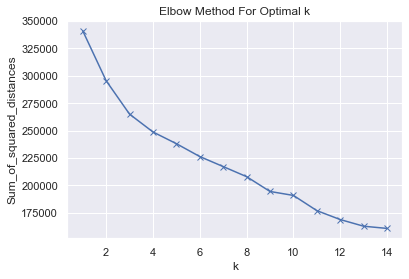

In [276]:
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()  # for plot styling

Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_buy_scaled)
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [277]:
kmeans = KMeans(n_clusters=4, algorithm="elkan").fit(data_buy_scaled)
new_centroids= scaler_buy.inverse_transform(kmeans.cluster_centers_)


fig = px.scatter_3d(x=data_buy_madrid["price"], 
                                  y=data_buy_madrid["surface"], 
                                  z=data_buy_madrid["rooms"],color=kmeans.labels_,
                                  labels={'x':'price', 'y':'surface', 'z':'rooms'}
                                  )
fig.show()


fig = px.scatter(x=data_buy_madrid["price"], 
                                  y=data_buy_madrid["surface"], 
                                  color=kmeans.labels_,
                                  labels={'x':'price', 'y':'surface'}
                                  )
fig.show()

In [278]:
mapbox_at= "pk.eyJ1IjoiY3VyYXNhbzk5IiwiYSI6ImNrZTl2eTJpeDJhaDEzN243YXdjY24zN20ifQ.cRm0go3r-tdZdTU-GBQitw"


fig = px.scatter_mapbox(data_buy_madrid, lat='lat', lon='lon', color=kmeans.labels_, size="price",
                  color_continuous_scale=px.colors.sequential.Plasma, size_max=15, center=dict(lat=40.416775, lon=-3.70339), zoom=12)
fig.update_layout(mapbox_style="basic", mapbox_accesstoken=mapbox_at)
fig.show()

In [279]:
data_buy_madrid["label"]=kmeans.labels_

data_buy_madrid.groupby('label').mean()

,toilets,price,rooms,surface,images_len,features_len,lat,lon,parking,security,...,storage,pool,pool_community,garden_community,new_construction,sports,public_transport,chimney,elevator,air_conditioning
label,,,,,,,,,,,,,,,,,,,,,
0,2.628148,438480.531852,3.124444,146.315556,25.607407,14.053333,38.144519,-7.546167,0.678519,0.229630,...,0.528889,0.038519,0.496296,0.774815,0.005926,0.213333,0.333333,0.054815,0.751111,0.617778
1,2.405152,567651.603435,3.351028,160.688264,29.155347,11.139995,37.312147,-9.193014,0.573250,0.000000,...,0.649493,0.000520,0.412438,0.000000,0.000000,0.152745,0.048400,0.001041,0.762425,0.673432
2,1.409203,235829.496537,2.561099,90.279258,19.113394,7.774621,38.789174,-6.746840,0.073013,0.000117,...,0.100247,0.001878,0.019368,0.002348,0.000000,0.009743,0.026529,0.000000,0.419533,0.307665
3,3.924448,840971.844652,5.179117,437.326825,37.859932,11.235144,38.754493,-7.010507,0.854839,0.004244,...,0.603565,0.846350,0.092530,0.073005,0.000000,0.110357,0.017827,0.039049,0.012733,0.544992


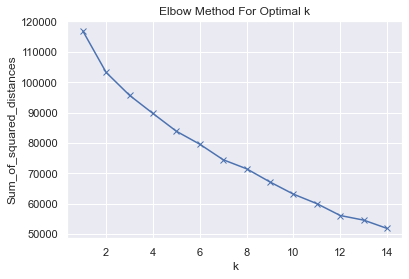

In [280]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_rent_scaled)
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [281]:
kmeans = KMeans(n_clusters=4, algorithm="elkan").fit(data_rent_scaled)
new_centroids= scaler_rent.inverse_transform(kmeans.cluster_centers_)


fig = px.scatter_3d(x=data_rent_madrid["price"], 
                                  y=data_rent_madrid["surface"], 
                                  z=data_rent_madrid["rooms"],color=kmeans.labels_,
                                  labels={'x':'price', 'y':'surface', 'z':'rooms'}
                                  )
fig.show()


fig = px.scatter(x=data_rent_madrid["price"], 
                                  y=data_rent_madrid["surface"], 
                                  color=kmeans.labels_,
                                  labels={'x':'price', 'y':'surface'}
                                  )
fig.show()

In [282]:
mapbox_at= "pk.eyJ1IjoiY3VyYXNhbzk5IiwiYSI6ImNrZTl2eTJpeDJhaDEzN243YXdjY24zN20ifQ.cRm0go3r-tdZdTU-GBQitw"


fig = px.scatter_mapbox(data_rent_madrid, lat='lat', lon='lon', color=kmeans.labels_, size="price",
                  color_continuous_scale=px.colors.sequential.Plasma, size_max=15, center=dict(lat=40.416775, lon=-3.70339), zoom=12)
fig.update_layout(mapbox_style="basic", mapbox_accesstoken=mapbox_at)
fig.show()

In [283]:
data_rent_madrid["label"]=kmeans.labels_

data_rent_madrid.groupby('label').mean()

,toilets,price,rooms,surface,images_len,features_len,lat,lon,parking,security,...,storage,pool,pool_community,garden_community,new_construction,sports,public_transport,chimney,elevator,air_conditioning
label,,,,,,,,,,,,,,,,,,,,,
0,2.409706,2142.450278,3.161496,150.579952,28.461416,10.283214,39.591071,-5.367737,0.236277,0.001591,...,0.215593,0.000000,0.077168,0.003978,0.0,0.006364,0.055688,0.004773,0.879077,0.782021
1,4.395833,4495.833333,4.968750,423.593750,31.406250,12.260417,38.755683,-7.612855,0.885417,0.000000,...,0.479167,0.916667,0.229167,0.041667,0.0,0.145833,0.010417,0.062500,0.083333,0.781250
2,1.156202,978.005258,1.747912,65.184040,18.456542,8.916177,39.072059,-6.499105,0.067430,0.000928,...,0.062790,0.000309,0.031550,0.001237,0.0,0.007423,0.039901,0.000619,0.593566,0.527683
3,1.897119,1291.301783,2.390947,108.832647,23.565158,13.115226,38.038214,-8.011210,0.673525,0.093278,...,0.641975,0.000000,0.836763,0.171468,0.0,0.351166,0.101509,0.008230,0.920439,0.711934
